# 1. plot all subjects accuracy on MNI template
1.1 after 0_6 erp binary classification, we have get all subjects accuracy results(include cue and read task acc) across all frequency band(save_acc_dir = f'/public/DATA/overt_reading/bands_acc'), the results save as dict, key=[band], values=[accuracy on 256 electrodes]

1.2 then we can load these data and plot these on a 2D brain, only if the accuracy > 0.5, we text it with{HS}_{elec_id}

In [1]:
import numpy as np
from sklearn.preprocessing import StandardScaler
import os
import sys
sys.path.append('../')
from ecog_band.utils import *
import pandas as pd
from sklearn.metrics import precision_score, recall_score, f1_score, classification_report, confusion_matrix
import torch
from torch.utils import data as Data
from sklearn.model_selection import GridSearchCV,train_test_split
import torch.nn as nn
import seaborn as sns
from matplotlib.colors import Normalize
from matplotlib.patches import Rectangle
import scipy.io as scio
import matplotlib.image as mpimg
import matplotlib as mpl
import matplotlib.patches as patches
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D


bands_list = {
    'delta': (1, 4),
    'theta': (4, 8),
    'alpha': (8, 12),
    'beta': (12, 30),
    'gamma': (30, 70),
    'high gamma':(70,150),
    'else2':(150,min(400/2, 300))
}
freq_list=[400]
HS_list=[68, 69, 75, 79, 82, 83, 84, 85, 86]
mpl.rcParams['font.size'] =10

## 1.1 Plot the classification accuracy of all electrodes across subjects, with color intensity indicating accuracy level.

In [3]:
def load_all_subjects_acc(HS_list, freq_list, band):
    all_coords, all_values = [], []
    for HS in HS_list:
        for freq in freq_list:
            save_acc_path = f'/public/DATA/overt_reading/bands_acc/{HS}/{freq}'
            bands_acc = np.load(os.path.join(save_acc_path, 'bands_acc.npy'), allow_pickle=True).item()
            band_acc = bands_acc[band]
            subject_str = f"HS{HS}"
            
            # Load 3D electrode coordinates in MNI space
            path = '/public/DATA/overt_reading/'
            coords = scio.loadmat(path + f"/elecs/All_elecs/{subject_str}_warped_elec_pos2D.mat")['elecmatrix']

            for i, acc in enumerate(band_acc):
                all_coords.append(coords[i])  # Append each electrode's coordinates
                all_values.append(acc)        # Append each electrode's accuracy

    return np.array(all_coords), np.array(all_values)

def plot_brain_surface_with_acc(all_coords, all_values, band, view_2D=True):
    if view_2D:
        # Load 2D brain image
        img = mpimg.imread('/public/DATA/overt_reading/elecs/Brain2D/MNI152_brain2D.png')
        plt.figure(figsize=(15, 15))
        plt.imshow(img)
        plt.scatter(all_coords[:, 0], all_coords[:, 1], c=all_values, cmap='Reds', alpha=0.7)
        plt.colorbar(label='Accuracy')
        plt.title(f'Electrode Accuracy across Subjects - Band: {band}')
        plt.axis('off')
        plt.show()
    else:
        # Plot 3D brain model
        fig = plt.figure(figsize=(10, 10))
        ax = fig.add_subplot(111, projection='3d')
        img = mpimg.imread('/public/DATA/overt_reading/elecs/Brain3D/MNI152_brain3D.png')
        
        sc = ax.scatter(all_coords[:, 0], all_coords[:, 1], all_coords[:, 2], c=all_values, cmap='Reds', alpha=0.7)
        fig.colorbar(sc, ax=ax, label='Accuracy')
        
        ax.set_xlabel('X (MNI)')
        ax.set_ylabel('Y (MNI)')
        ax.set_zlabel('Z (MNI)')
        ax.set_title(f'3D Electrode Accuracy across Subjects - Band: {band}')
        plt.show()


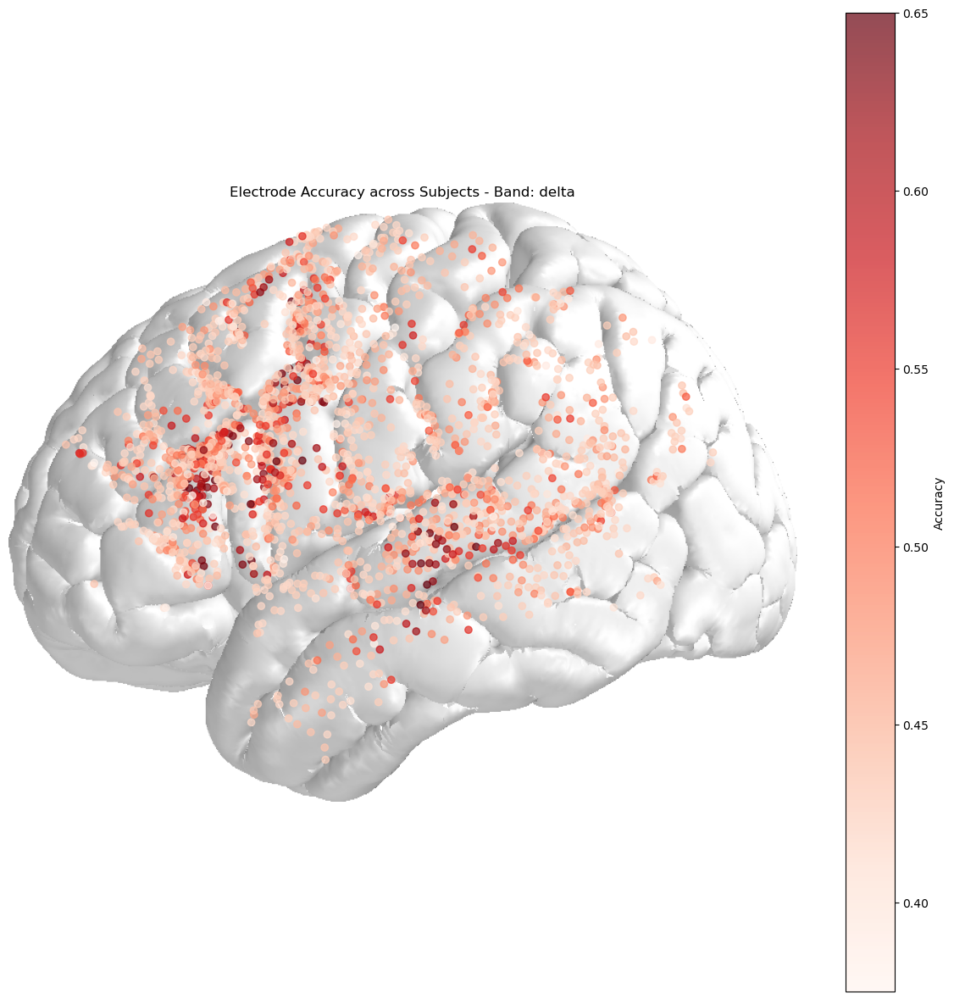

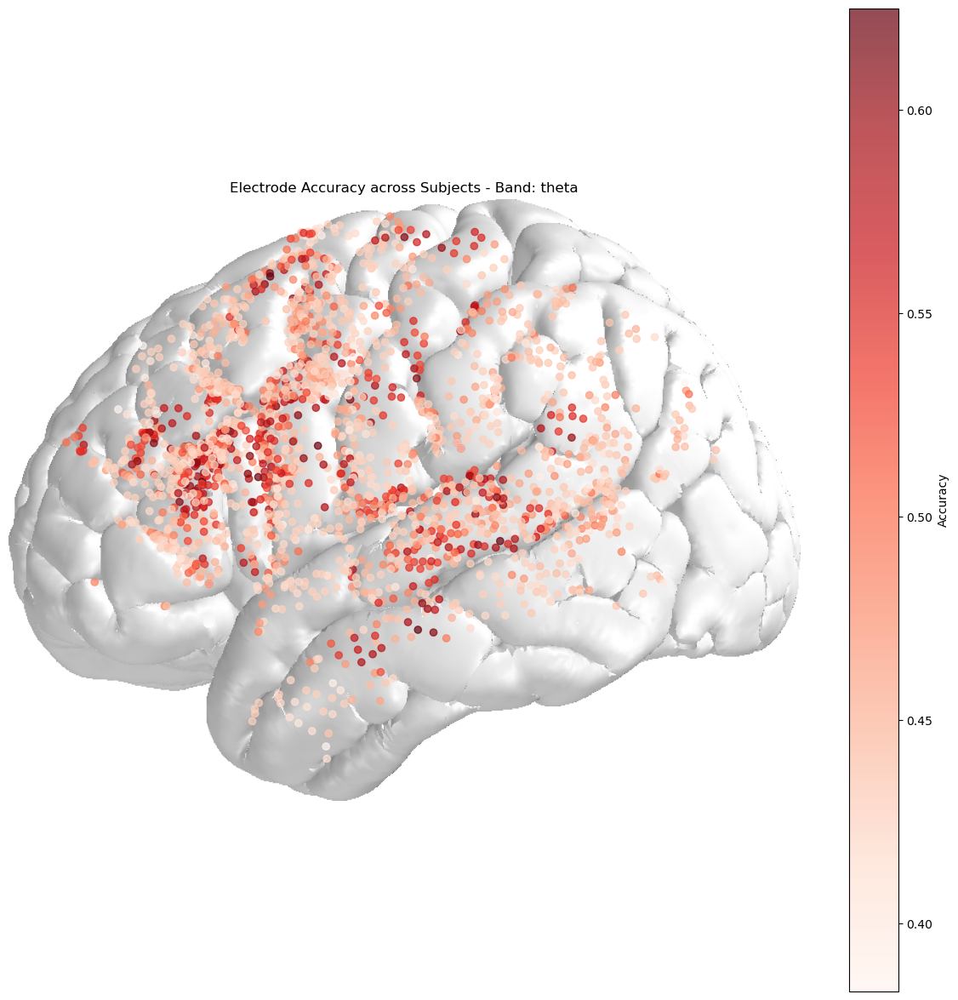

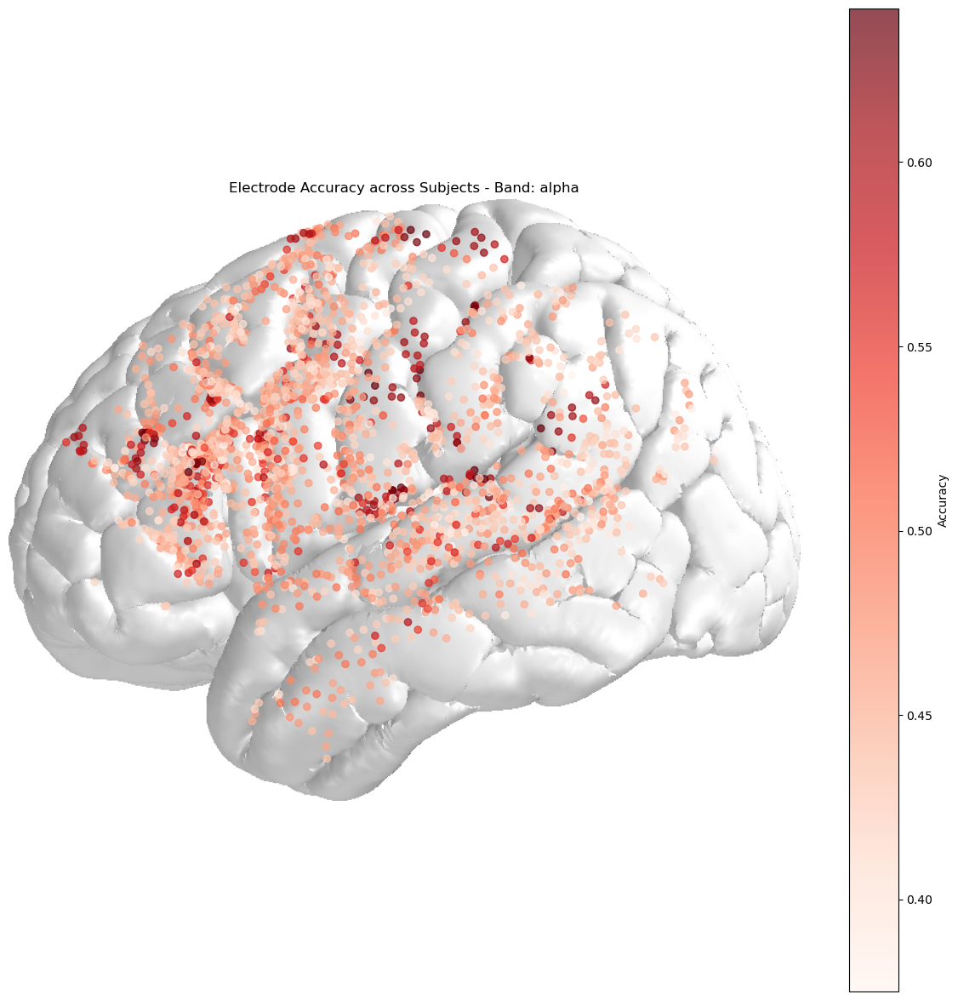

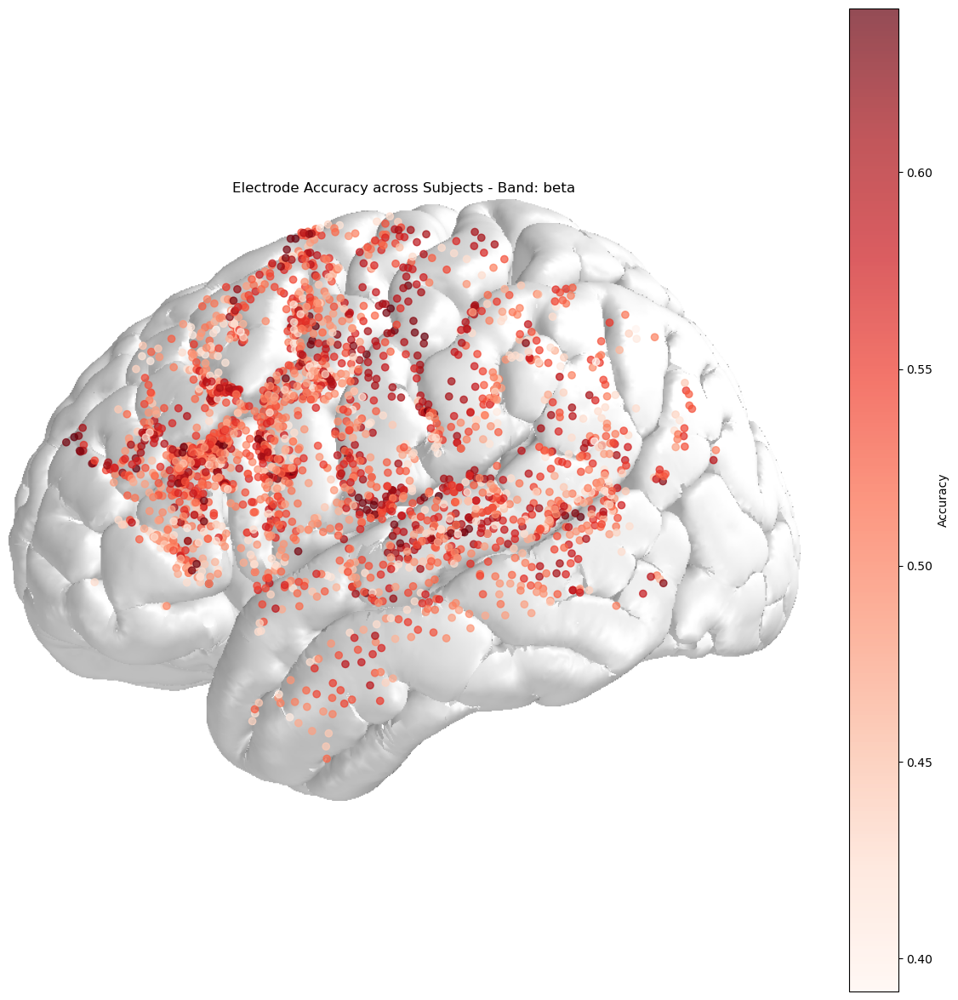

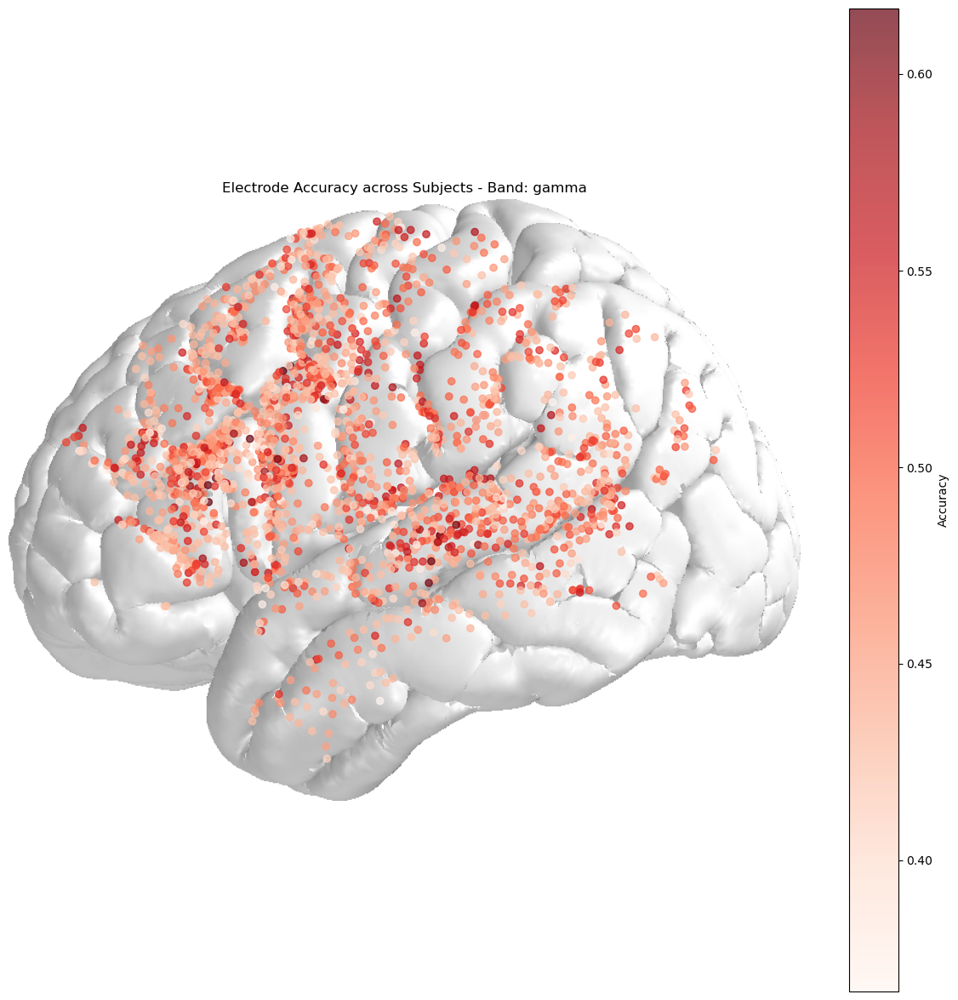

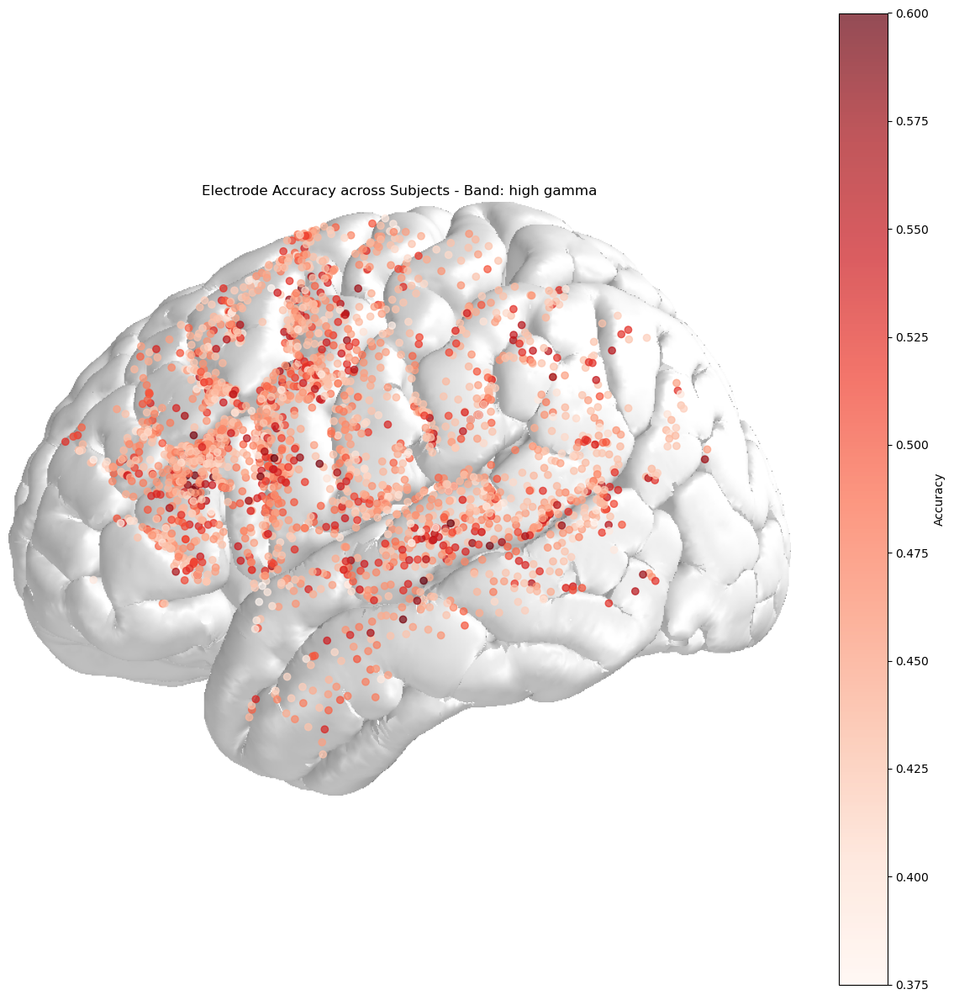

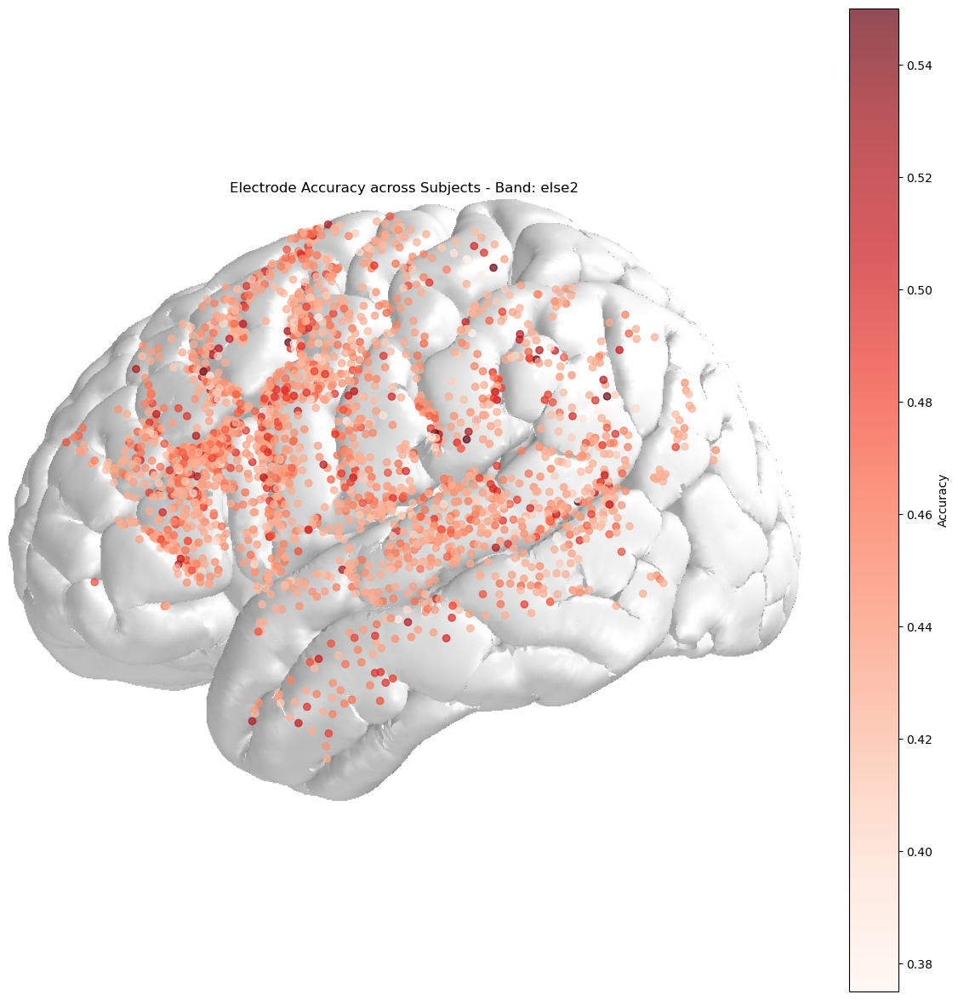

In [4]:
for band in bands_list.keys():
    all_coords, all_values = load_all_subjects_acc(HS_list, freq_list, band)
    # Plot accuracy on brain surface
    plot_brain_surface_with_acc(all_coords, all_values, band, view_2D=True)

## 1.2 Plot the classification accuracy of all electrodes, with color intensity representing accuracy level and different colors indicating individual subjects.

In [7]:
import matplotlib.cm as cm

# 添加右侧颜色条函数
def add_right_cax(ax, pad, width):
    axpos = ax.get_position()
    caxpos = mpl.transforms.Bbox.from_extents(
        axpos.x1 + pad,
        axpos.y0,
        axpos.x1 + pad + width,
        axpos.y1
    )
    cax = ax.figure.add_axes(caxpos)
    return cax

# 绘制多个被试的电极准确率在标准脑模板上
def plot_multiple_subjects_acc_brain(HS_list, freq, band):
    path = '/public/DATA/overt_reading/'
    fig, ax = plt.subplots(figsize=(15, 15))
    img = mpimg.imread(path + "/elecs/Brain2D/MNI152_brain2D.png")
    ax.imshow(img)
    
    # 为每个被试生成不同颜色
    # colors = cm.get_cmap('tab20', len(HS_list))
    # colors = cm.get_cmap('Set3', len(HS_list))
    colors = cm.get_cmap('viridis', len(HS_list))  # 更改为viridis
    legend_handles = []
    all_values = []

    for i, HS in enumerate(HS_list):
        color = colors(i)  # 每个被试一个颜色
        save_acc_path = os.path.join(f'/public/DATA/overt_reading/bands_acc', f'{HS}', f'{freq}')
        bands_acc = np.load(os.path.join(save_acc_path, 'bands_acc.npy'), allow_pickle=True).item()
        band_acc = bands_acc[band]

        # 加载电极位置和解剖信息
        subject_str = f"HS{HS}"
        xy = scio.loadmat(path + f"/elecs/All_elecs/{subject_str}_warped_elec_pos2D.mat")['elecmatrix']
        anatomy = scio.loadmat(path + f"/elecs/All_elecs/{subject_str}_elecs_all_warped.mat")['anatomy']

        x_coords, y_coords, values = [], [], []
        electrode_count = 0
        for elec, acc in enumerate(band_acc):
            x_coords.append(xy[elec][0])
            y_coords.append(xy[elec][1])
            values.append(acc)

            if acc > 0.6:  # 高于阈值的电极标记
                plt.text(xy[elec][0], xy[elec][1], f"{HS}_{elec}", color=color)
                electrode_count += 1

        all_values.extend(values)
        # 绘制当前被试的电极位置
        scatter = ax.scatter(x_coords, y_coords, c=values, cmap='Reds', alpha=0.7, label=f'Subject HS{HS}', edgecolor=color)
        legend_handles.append(scatter)

    # 配置图例显示每个被试的颜色标记
    ax.legend(handles=legend_handles, title="Subjects", loc='upper right', fontsize=10, title_fontsize=12)

    # 配置颜色条
    cax = add_right_cax(ax, pad=0.02, width=0.02)
    cbar = fig.colorbar(scatter, cax=cax)
    # cbar.set_label('Accuracy', fontsize=12)
    # cbar.set_ticks(np.linspace(min(all_values), max(all_values), 5))
    plt.grid(False)
    plt.axis('off')
    plt.title(f'Electrode accuracy for each subject on {band}')
    plt.show()


/tmp/ipykernel_8362/3266390176.py:25: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = cm.get_cmap('viridis', len(HS_list))  # 更改为viridis


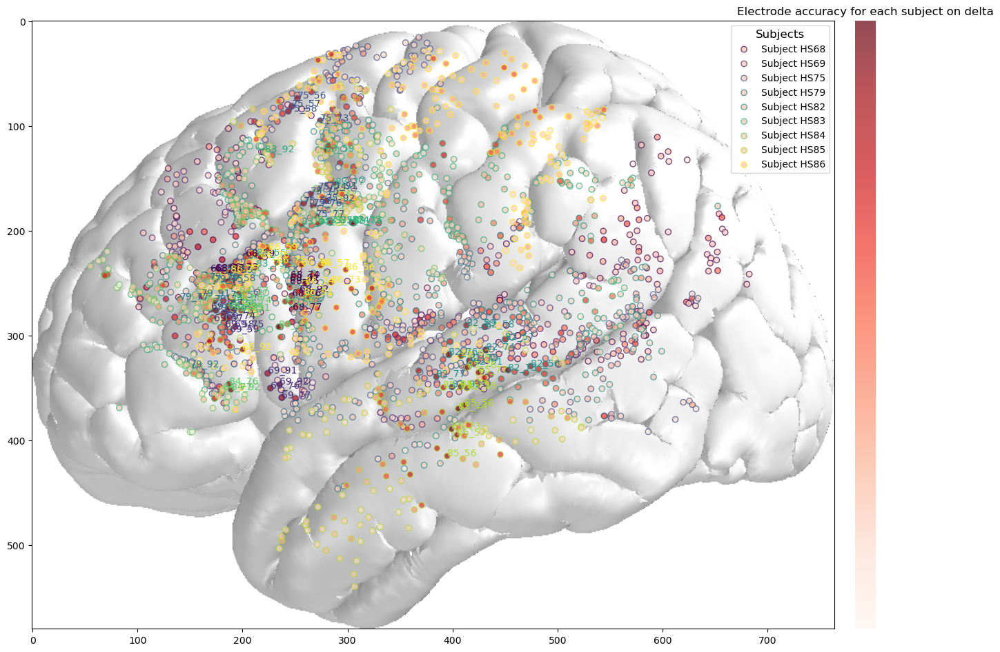

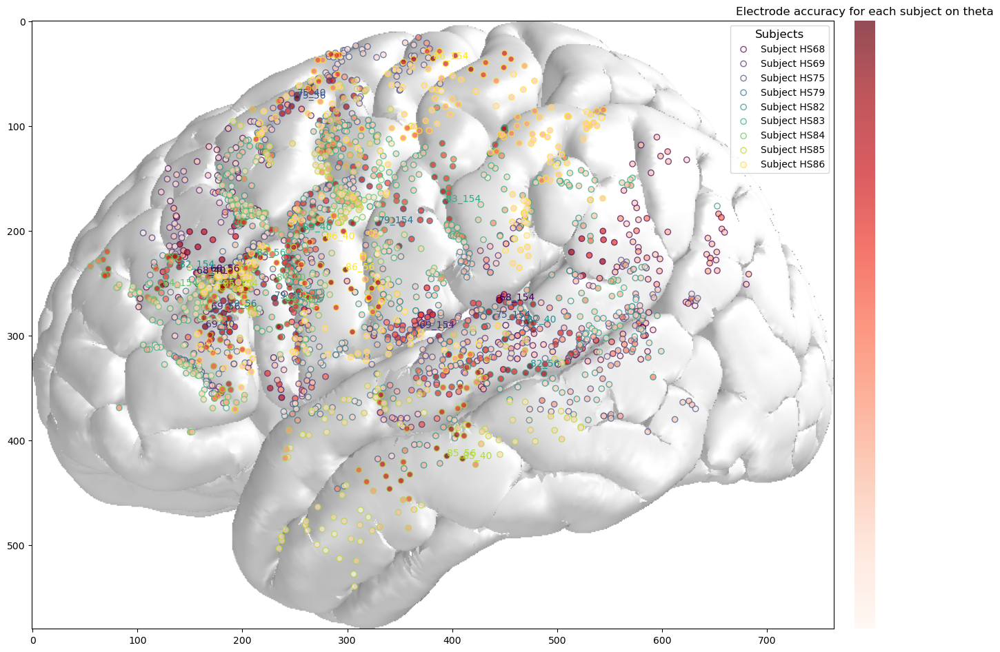

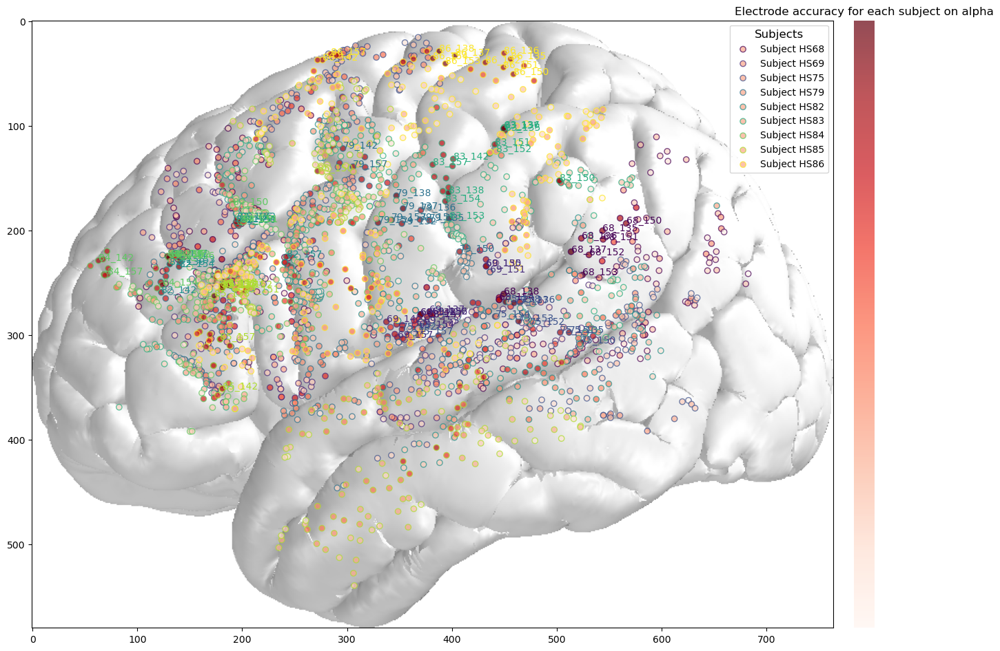

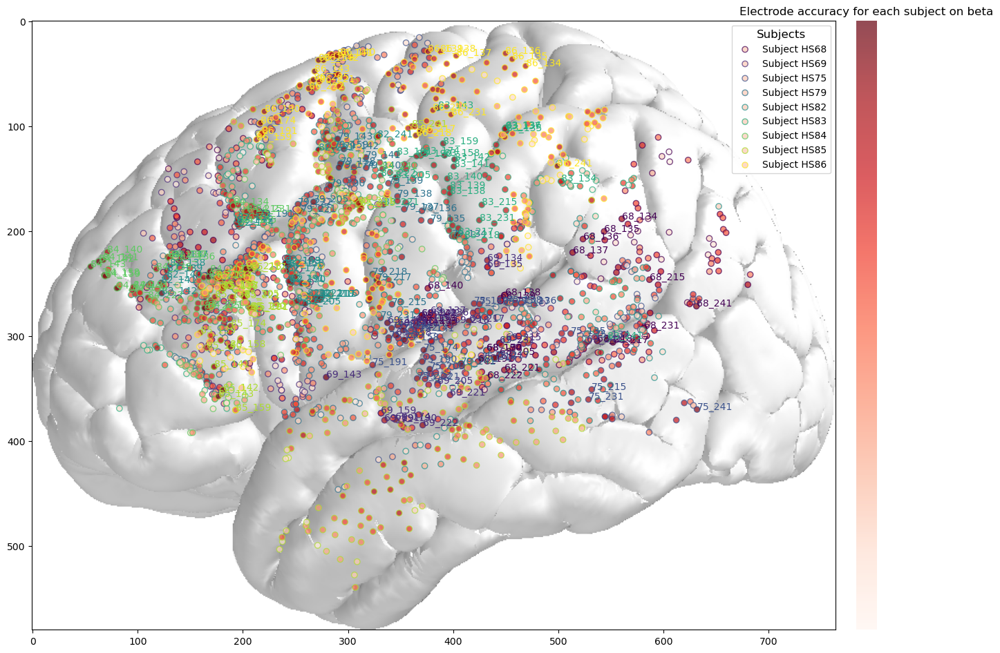

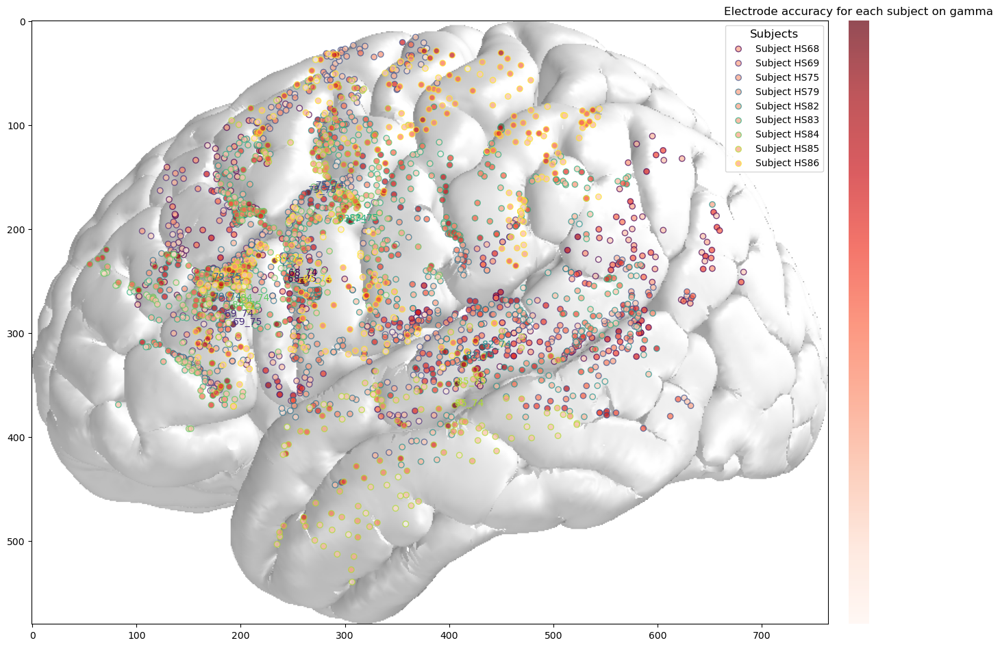

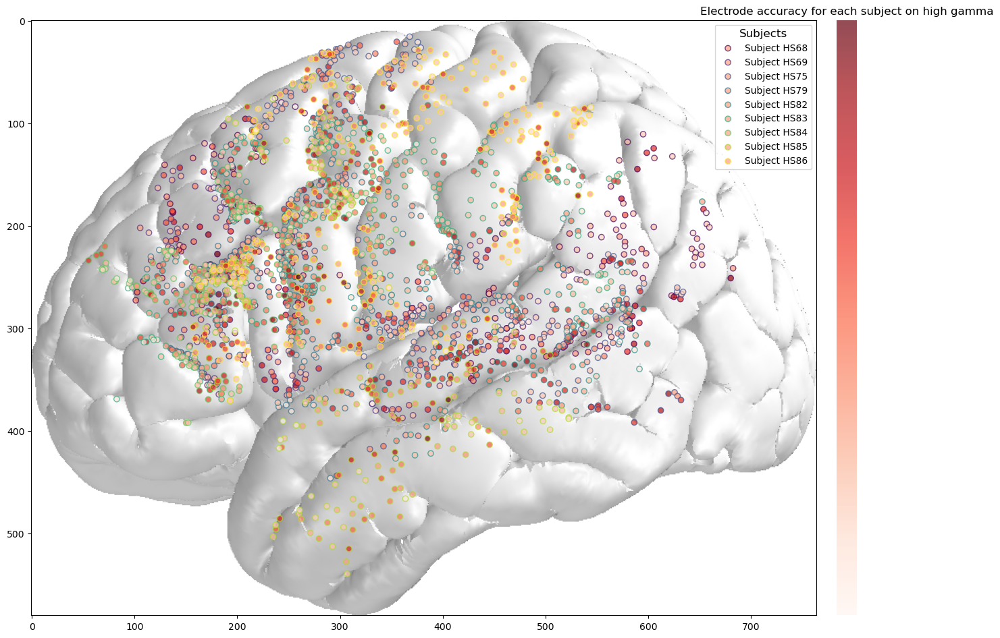

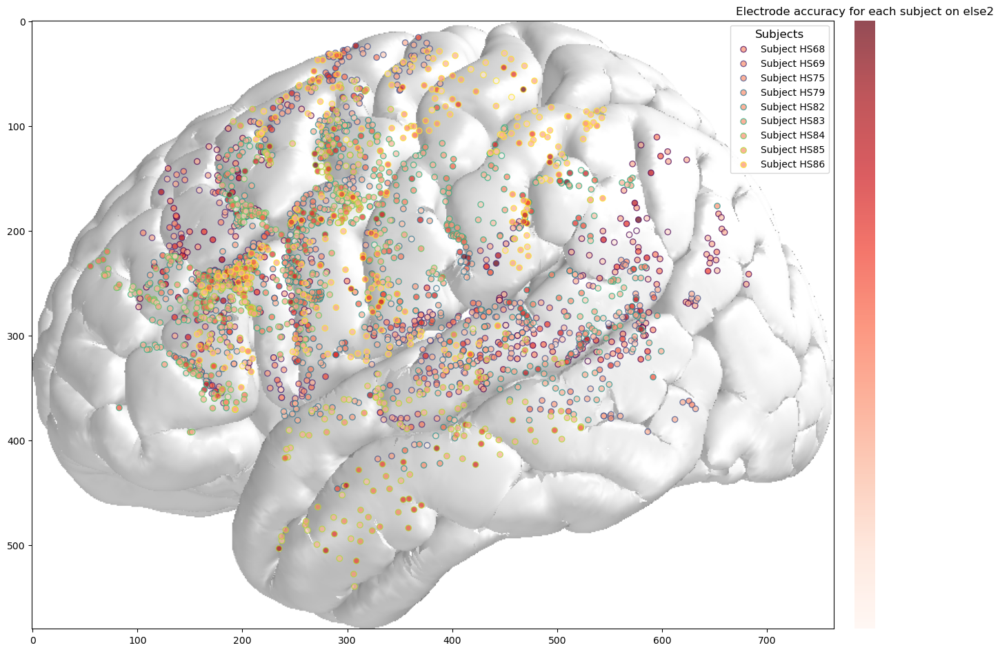

In [8]:
for freq in freq_list:
    for band in bands_list.keys():
        plot_multiple_subjects_acc_brain(HS_list, freq, band)
